# WRF Example Notebook

Demonstrates using ldcpy on wrf data. 

On NCAR's Jupyterhub, environment NPL 2024b is a good option (Note: it contains an old version of ldcpy that does not support WRF data.  So make sure you have a recent version from https://github.com/NCAR/ldcpy.)


In [1]:
import os
import sys

import cf_xarray as cf
import xarray as xr
import xwrf

%load_ext autoreload
%autoreload 2
%matplotlib inline
sys.path.insert(0, '/Users/abaker/alli/code-repo/ldcpy')

# suppress all of the divide by zero warnings
import warnings

import ldcpy

warnings.filterwarnings("ignore")

In [2]:
os.environ["HDF5_PLUGIN_PATH"]

KeyError: 'HDF5_PLUGIN_PATH'

In [64]:
mydir = "/Users/abaker/alli/wrf/wrf_24hr_compare/"
filename = "wrf2d_combined.nc"
file2d_orig = mydir + "orig/" + filename
file2d_p100 = mydir + "sperr_p100/" + filename
file2d_pwe = mydir + "sperr_pwe1e-3/" + filename

# file2d_gbr2 = mydir + "gbr2/" + filename
file2d_gbr3 = mydir + "gbr3/" + filename
file2d_gbr4 = mydir + "gbr4/" + filename

fileconsts = mydir + "wrfconstants_usgs404.nc"

In [65]:
# file sizes? (optional to include in table)
my_sizes = []
my_sizes.append(os.path.getsize(file2d_orig))
my_sizes.append(os.path.getsize(file2d_p100))
my_sizes.append(os.path.getsize(file2d_pwe))
# my_sizes.append(os.path.getsize(file2d_gbr2))
my_sizes.append(os.path.getsize(file2d_gbr3))
my_sizes.append(os.path.getsize(file2d_gbr4))

my_sizes

[23000040376, 5027438196, 7264593906, 4649360033, 6043461291]

In [66]:
c = {'longitude': ['lon'], 'latitude': ['lat']}

In [67]:
if 'time' in c.keys():
    print('yes')

In [68]:
# open dataset and process with xwrf
ds_orig = xr.open_dataset(file2d_orig, engine="netcdf4").xwrf.postprocess()
ds_p100 = xr.open_dataset(file2d_p100, engine="netcdf4").xwrf.postprocess()
ds_pwe = xr.open_dataset(file2d_pwe, engine="netcdf4").xwrf.postprocess()
ds_gbr3 = xr.open_dataset(file2d_gbr3, engine="netcdf4").xwrf.postprocess()
ds_gbr4 = xr.open_dataset(file2d_gbr4, engine="netcdf4").xwrf.postprocess()


# oordinates
ds_const = xr.open_dataset(fileconsts, engine="netcdf4").xwrf.postprocess()

In [69]:
# make an ldcpy collection to compare data (and pick a few variables)
combine_col = ldcpy.collect_datasets(
    "wrf",
    ["T2", "U10", "Q2", "V10", "U", "V", "SNLIQ", "LWUPT"],
    [ds_orig, ds_p100, ds_pwe, ds_gbr3, ds_gbr4],
    ["orig", "sperr_psnr100", "sperr_pwe1e-3", "gbr3", "gbr4"],
    coords_ds=ds_const,
    file_sizes=my_sizes,
)

dataset size in GB 6.69



In [70]:
combine_col

<xarray.Dataset> Size: 7GB
Dimensions:     (collection: 5, Time: 24, y: 1015, x: 1367, x_stag: 1368,
                 y_stag: 1016, snow_layers_stag: 3)
Coordinates: (12/13)
    XTIME       (Time) datetime64[ns] 192B 2020-07-01 ... 2020-07-01T23:00:00
  * Time        (Time) datetime64[ns] 192B 2020-07-01 ... 2020-07-01T23:00:00
    XLAT        (y, x) float32 6MB 17.65 17.66 17.67 17.68 ... 51.73 51.71 51.69
    XLONG       (y, x) float32 6MB -122.6 -122.5 -122.5 ... -57.17 -57.12 -57.07
    XLAT_U      (y, x_stag) float32 6MB 17.64 17.65 17.66 ... 51.72 51.7 51.69
    XLONG_U     (y, x_stag) float32 6MB -122.6 -122.6 -122.5 ... -57.09 -57.04
    ...          ...
    XLONG_V     (y_stag, x) float32 6MB -122.6 -122.5 -122.5 ... -57.11 -57.06
  * x           (x) float64 11kB -2.732e+06 -2.728e+06 ... 2.728e+06 2.732e+06
  * y           (y) float64 8kB -2.028e+06 -2.024e+06 ... 2.024e+06 2.028e+06
  * x_stag      (x_stag) float64 11kB -2.734e+06 -2.73e+06 ... 2.734e+06
  * y_stag      (y_stag) float64 8kB -2.03e+06 -2.026e+06 ... 2.026e+06 2.03e+06
  * collection  (collection) <U13 260B 'orig' 'sperr_psnr100' ... 'gbr3' 'gbr4'
Dimensions without coordinates: snow_layers_stag
Data variables:
    T2          (collection, Time, y, x) float32 666MB 298.4 298.3 ... 282.4
    U10         (collection, Time, y, x) float32 666MB -3.837 -3.905 ... -1.759
    Q2          (collection, Time, y, x) float32 666MB 0.01757 ... 0.007383
    V10         (collection, Time, y, x) float32 666MB -0.8195 ... -4.563
    U           (collection, Time, y, x_stag) float32 666MB -3.995 ... -2.04
    V           (collection, Time, y_stag, x) float32 667MB -0.8753 ... -5.314
    SNLIQ       (collection, Time, snow_layers_stag, y, x) float32 2GB 0.0 .....
    LWUPT       (collection, Time, y, x) float32 666MB 280.4 280.3 ... 245.2
Attributes: (12/152)
    TITLE:                            OUTPUT FROM WRF V3.9.1.1 MODEL
    START_DATE:                      2020-06-05_00:00:00
    SIMULATION_START_DATE:           1979-10-01_00:00:00
    WEST-EAST_GRID_DIMENSION:        1368
    SOUTH-NORTH_GRID_DIMENSION:      1016
    BOTTOM-TOP_GRID_DIMENSION:       51
    ...                              ...
    history:                         Thu Sep 12 14:28:58 2024: ncap2 -s where...
    history_of_appended_files:       Wed May  4 13:07:22 2022: Appended file ...
    cell_measures:                   area: cell_area
    data_type:                       wrf
    file_size:                       {'orig': 23000040376, 'sperr_psnr100': 5...
    weighted:                        False

In [71]:
# look at T2 stats at 12 hours
t2_time12 = combine_col.isel(Time=12)
ldcpy.compare_stats(
    t2_time12,
    "T2",
    ["orig", "sperr_psnr100", "sperr_pwe1e-3", "gbr3", "gbr4"],
    significant_digits=7,
    aggregate_dims=["y", "x"],
)

,orig,sperr_psnr100,sperr_pwe1e-3,gbr3,gbr4
mean,292.5255,292.5255,292.5255,292.5254,292.5255
variance,44.65586,44.65586,44.65586,44.76316,44.65684
standard deviation,6.682506,6.682506,6.682506,6.69053,6.68258
min value,267.6981,267.6982,267.6986,268,267.6875
min (abs) nonzero value,267.6981,267.6982,267.6986,268,267.6875
max value,303.3593,303.3588,303.3598,303,303.375
probability positive,1,1,1,1,1
number of zeros,0,0,0,0,0
99% real information cutoff bit,1,1,1,1,1
entropy estimate,0.3861147,0.3861112,0.3860819,0.03400087,0.1291291


,sperr_psnr100,sperr_pwe1e-3,gbr3,gbr4
max abs diff,0.001312256,0.00100708,0.5,0.03125
min abs diff,0,0,0,0
mean abs diff,0.0002454069,0.000333235,0.2493174,0.01561545
mean squared diff,2.205443e-14,8.845306e-14,9.907887e-09,1.000604e-09
root mean squared diff,0.0003051018,0.0004099042,0.2881453,0.01803118
normalized root mean squared diff,8.555553e-06,1.149438e-05,0.008080067,0.0005056237
normalized max pointwise error,3.508628e-05,2.824017e-05,0.01401996,0.0008754454
pearson correlation coefficient,1,1,0.9990722,0.9999964
ks p-value,1,1,0,3.169477e-09
spatial relative error(% > 0.0001),0,0,94.09999,6.336842


In [39]:
# look at wind at time=0- notice agg dims are different
u_time0 = combine_col.isel(Time=0)
ldcpy.compare_stats(
    u_time0,
    "U",
    ["orig", "sperr_psnr100", "sperr_pwe1e-3", "gbr3", "gbr4"],
    significant_digits=7,
    aggregate_dims=["y", "x_stag"],
)

,orig,sperr_psnr100,sperr_pwe1e-3,gbr3,gbr4
mean,0.1099268,0.1099262,0.1099273,0.1099291,0.1099268
variance,16.22078,16.22078,16.22078,16.22076,16.22078
standard deviation,4.027504,4.027504,4.027504,4.027502,4.027505
min value,-20.23387,-20.23444,-20.23411,-20.25,-20.23438
min (abs) nonzero value,3.146056e-06,5.339411e-06,2.248051e-06,3.144145e-06,3.146008e-06
max value,20.24547,20.24629,20.2452,20.25,20.24219
probability positive,0.4819635,0.4819729,0.4819592,0.4819635,0.4819635
number of zeros,0,0,0,0,0
entropy estimate,0.5260497,0.5260506,0.5260272,0.2553095,0.3252425


,sperr_psnr100,sperr_pwe1e-3,gbr3,gbr4
max abs diff,0.001832247,0.0009999871,0.03124905,0.00390625
min abs diff,0,0,0,0
mean abs diff,0.0003313404,0.0003333872,0.001748906,0.0002160372
mean squared diff,2.636316e-13,2.665027e-13,5.73083e-12,3.638939e-15
root mean squared diff,0.0004116953,0.0004099498,0.002563152,0.000320431
normalized root mean squared diff,1.017051e-05,1.012738e-05,6.332002e-05,7.915914e-06
normalized max pointwise error,4.177694e-05,2.470364e-05,0.000771881,9.647629e-05
pearson correlation coefficient,1,1,0.9999998,1
ks p-value,1,1,0.9992661,1
spatial relative error(% > 0.0001),49.57566,50.12452,89.89478,26.87754


In [40]:
# this variable has muliple layers, so we pick one
snliq_time4 = combine_col.isel(Time=4).isel(snow_layers_stag=0)
ldcpy.compare_stats(
    snliq_time4,
    "SNLIQ",
    ["orig", "sperr_psnr100", "sperr_pwe1e-3", "gbr4"],
    significant_digits=7,
    aggregate_dims=["y", "x"],
)

,orig,sperr_psnr100,sperr_pwe1e-3,gbr4
mean,0.0007034585,0.0007034585,0.0007034585,0.000703458
variance,0.0004290575,0.0004290575,0.0004290575,0.0004290559
standard deviation,0.02071371,0.02071371,0.02071371,0.02071367
min value,0,0,0,0
min (abs) nonzero value,1.058454e-09,1.058454e-09,1.058454e-09,1.058652e-09
max value,1.229205,1.229205,1.229205,1.229492
probability positive,0.001243239,0.001243239,0.001243239,0.001243239
number of zeros,1385780,1385780,1385780,1385780
entropy estimate,0.001940984,0.001940984,0.001940984,0.001669994


,sperr_psnr100,sperr_pwe1e-3,gbr4
max abs diff,0,0,0.0004608631
min abs diff,0,0,0
mean abs diff,0,0,2.407321e-08
mean squared diff,0,0,2.609054e-19
root mean squared diff,0,0,1.473824e-06
normalized root mean squared diff,0,0,1.199005e-06
normalized max pointwise error,0,0,0.0003702726
pearson correlation coefficient,1,1,1
ks p-value,1,1,1
spatial relative error(% > 0.0001),0,0,0.002234226


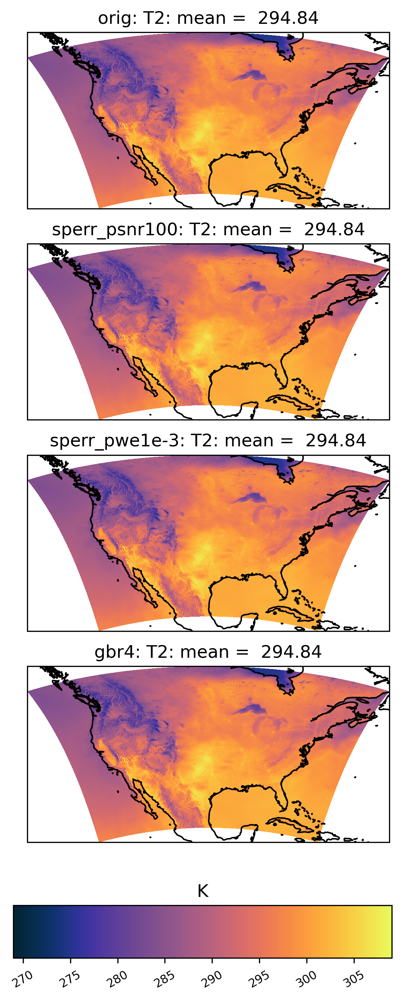

In [41]:
# plot mean T2 field of all three
ldcpy.plot(
    combine_col,
    "T2",
    sets=["orig", "sperr_psnr100", "sperr_pwe1e-3", "gbr4"],
    calc="mean",
    plot_type="spatial",
    color="cmo.thermal",
    vert_plot=True,
)

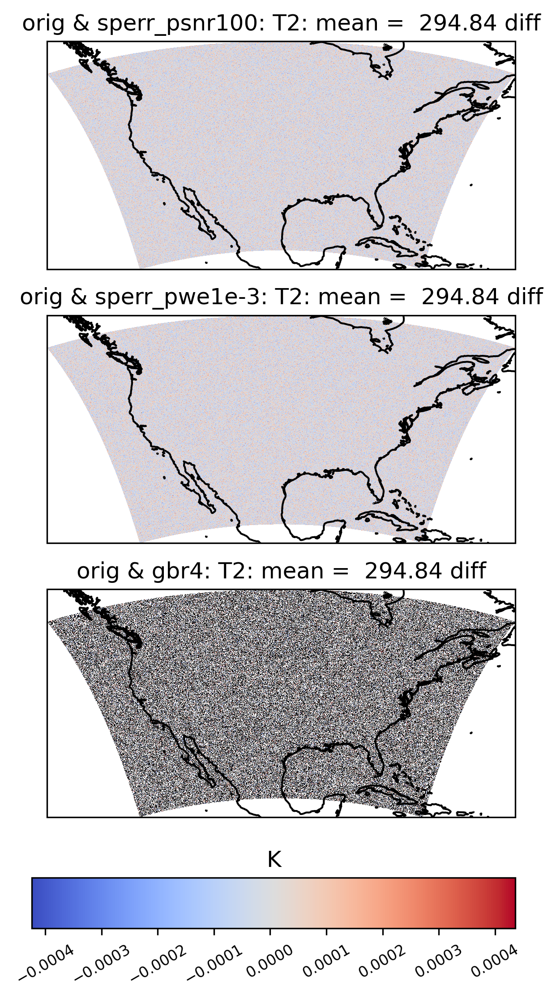

In [42]:
# plot mean T2 field - differences in compresses
ldcpy.plot(
    combine_col,
    "T2",
    sets=["orig", "sperr_psnr100", "sperr_pwe1e-3", "gbr4"],
    calc="mean",
    calc_type="diff",
    vert_plot=True,
)

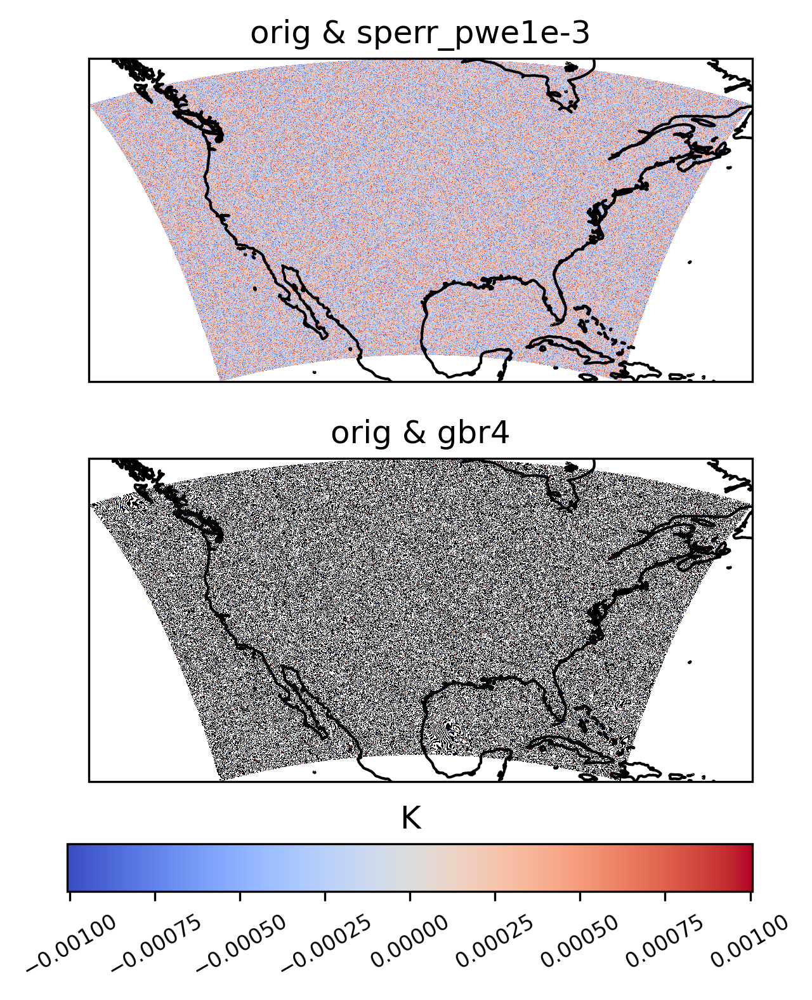

In [43]:
# plot mean T2 field - differences just at one time slice
ldcpy.plot(
    combine_col,
    "T2",
    sets=["orig", "sperr_pwe1e-3", "gbr4"],
    calc="mean",
    calc_type="diff",
    vert_plot=True,
    start=0,
    end=0,
    short_title=True,
)

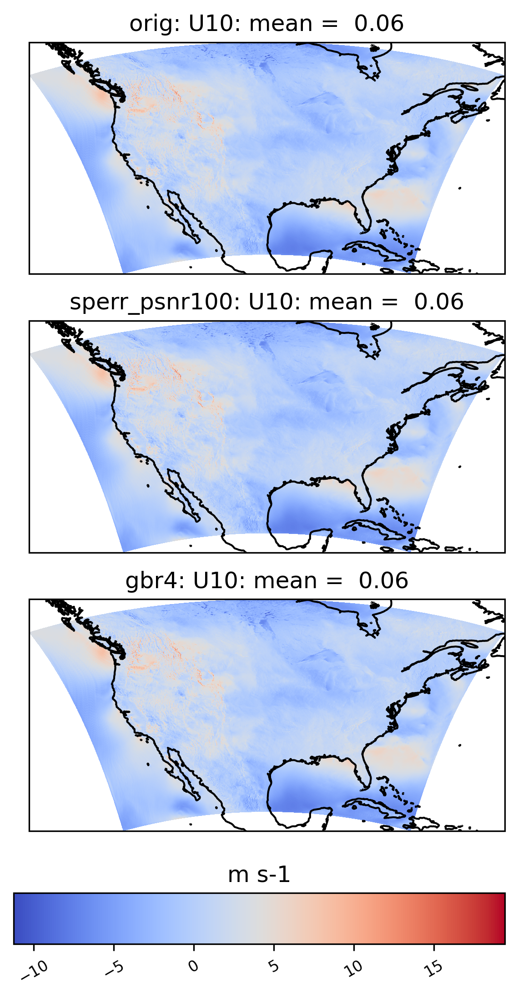

In [45]:
ldcpy.plot(
    combine_col,
    "U10",
    sets=["orig", "sperr_psnr100", "gbr4"],
    calc="mean",
    plot_type="spatial",
    vert_plot=True,
)

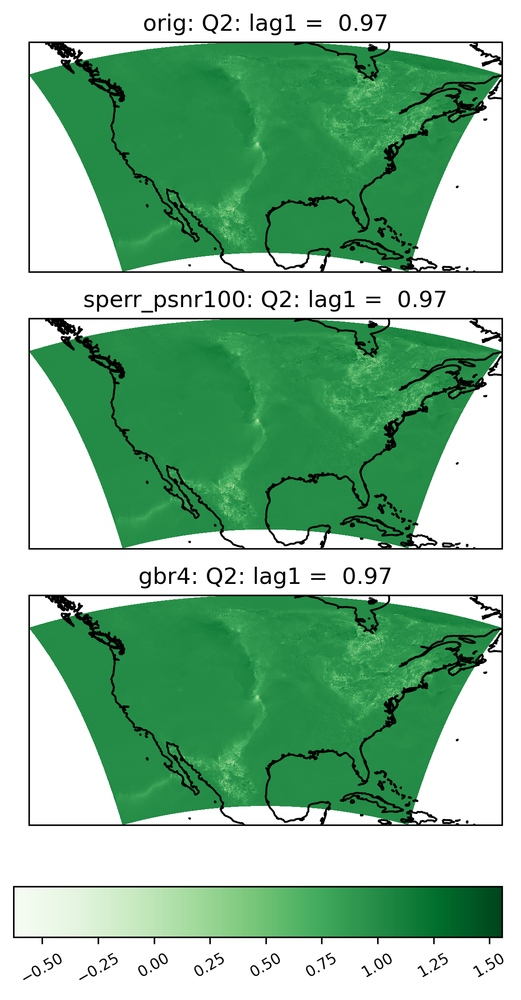

In [46]:
ldcpy.plot(
    combine_col,
    "Q2",
    sets=["orig", "sperr_psnr100", "gbr4"],
    calc="lag1",
    color="Greens",
    vert_plot=True,
)

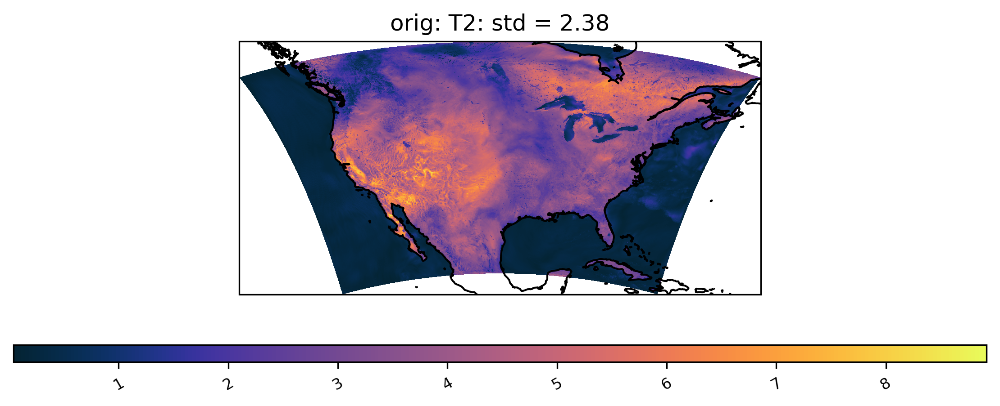

In [68]:
# plot of the standard deviation of T2 values  "orig" dataset
ldcpy.plot(combine_col, "T2", sets=["orig"], calc="std", color="cmo.thermal")

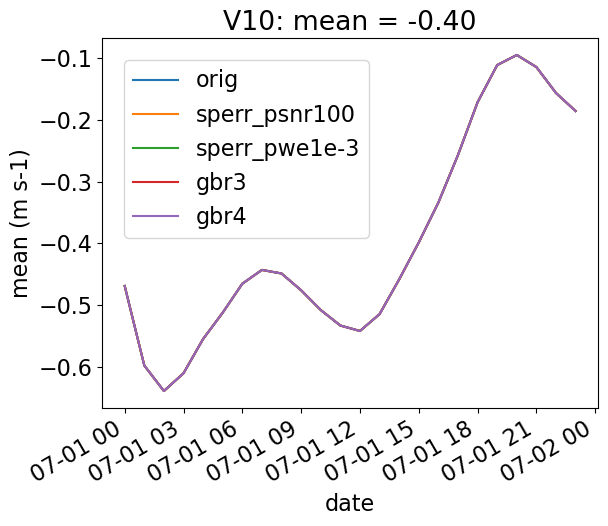

In [47]:
# Time-series plot of V10 mean (all stack)
ldcpy.plot(
    combine_col,
    "V10",
    sets=["orig", "sperr_psnr100", "sperr_pwe1e-3", "gbr3", "gbr4"],
    calc="mean",
    plot_type="time_series",
    vert_plot=True,
    legend_loc="best",
)

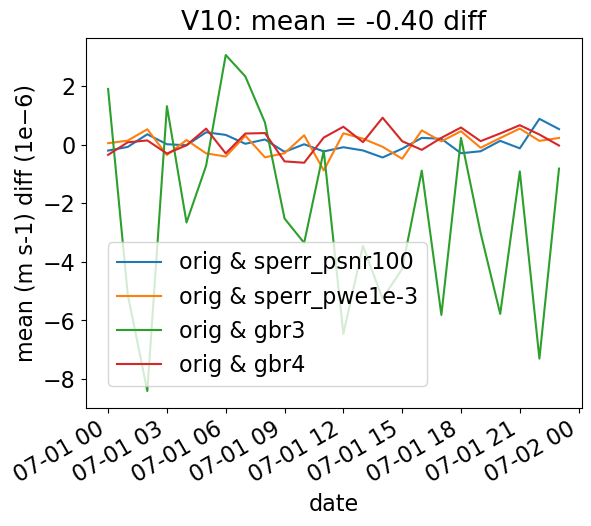

In [48]:
# Time-series plot of V10 mean  - look at differences
ldcpy.plot(
    combine_col,
    "V10",
    sets=["orig", "sperr_psnr100", "sperr_pwe1e-3", "gbr3", "gbr4"],
    calc="mean",
    calc_type="diff",
    plot_type="time_series",
    vert_plot=True,
    legend_loc="best",
)

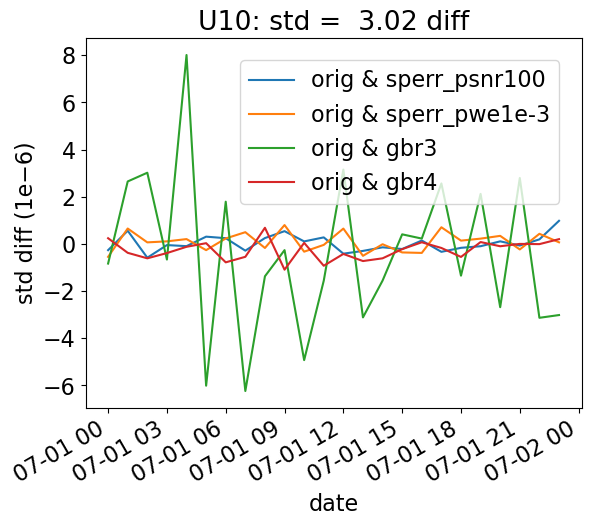

In [49]:
# Time-series plot of U10 standard deviation "orig" dataset
ldcpy.plot(
    combine_col,
    "U10",
    sets=["orig", "sperr_psnr100", "sperr_pwe1e-3", "gbr3", "gbr4"],
    calc="std",
    calc_type="diff",
    plot_type="time_series",
    vert_plot=True,
)

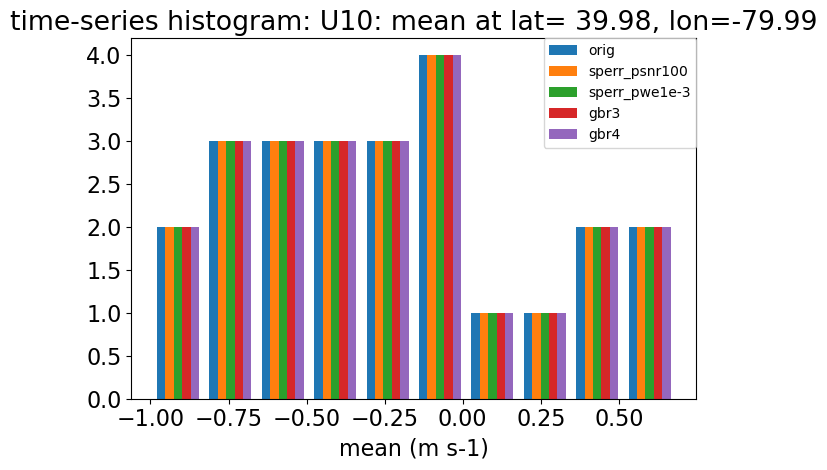

In [50]:
ldcpy.plot(
    combine_col,
    "U10",
    sets=["orig", "sperr_psnr100", "sperr_pwe1e-3", "gbr3", "gbr4"],
    calc="mean",
    plot_type="histogram",
    lat=40,
    lon=-80,
)